In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import torch

# Test it
print(f"Current Device: {torch.cuda.current_device()}")
print(f"Device Name: {torch.cuda.get_device_name(0)}") 
# Note: Because of the environment variable, GPU 1 now looks like '0' to PyTorch

Current Device: 0
Device Name: NVIDIA A100 80GB PCIe


# Based on Caustics + Caskade

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Ellipse
from matplotlib import colormaps
from IPython.display import HTML

from torch.nn.functional import conv2d, avg_pool2d
import torch
from torch import pi
from torch import where
from torch import Tensor

import caskade as ck
import caustics
from caustics import Module, forward, Param
from caustics import utils


from typing import Optional, Union, Annotated
from caskade import forward, Param
# from .base import Source, NameType
# from . import func

import copy
import h5py
import os
import scipy
import sncosmo
from PIL import Image
import galsim

from astropy.cosmology import WMAP9 as cosmo
from astropy.table import Table
from astropy.io import fits
from astropy import wcs

import matplotlib as mpl
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'serif'

In [3]:
date = '14_04_26'
extra_path = ''#'different_separations/small_sep/'

# Goldstein et al 2019 params

In [4]:
# Goldstein 2019 file
f = h5py.File('lsst-altsched-1a-lowz.h5','r')
simitems = np.asarray(f['system']['block0_items'][()],dtype=str)
simdataall = f['system']['block0_values'][()]

print(simitems.shape, simdataall.shape)
print(simitems[:32])

(32,) (233744, 32)
['t0' 'sigma' 'gamma' 'e' 'theta_e' 'theta_gamma' 'zs' 'zl' 'snx' 'sny'
 'MB' 'transient_amplitude' 'ebvhost' 'ra' 'dec' 'ebvmw' 'weight' 'host_n'
 'host_ellip' 'host_reff' 'host_theta' 'host_amplitude' 'host_x' 'host_y'
 'lensgal_n' 'lensgal_ellip' 'lensgal_reff' 'lensgal_theta'
 'lensgal_amplitude' 'lensgal_x' 'lensgal_y' 't_found']


In [5]:
# param = simdataall[:, simitems == "sigma"].squeeze()
# print(param[:15])

In [6]:
system_indx =  96679 #2737 #170330 #209546 #216276 #62425 #47818 #1125   #96679  # 72358 #154919  #84113 #12486 #1952 #17462  #1952
simdata=simdataall[system_indx]

z_lens = simdata[simitems == "zl"][0]
z_source = simdata[simitems == "zs"][0]
print('z lens',z_lens,'z source',z_source)

sn_x = simdata[simitems == "snx"][0]
sn_y = simdata[simitems == "sny"][0]

host_reff = simdata[simitems == "host_reff"][0]      # units? assuming arcsec
host_n = simdata[simitems == "host_n"][0]          
host_x = simdata[simitems == "host_x"][0]            # units? assuming arsec
host_y = simdata[simitems == "host_y"][0]            # units? assuming arcsec
host_theta = simdata[simitems == "host_theta"][0]    # units? assuming radians
host_ellip = simdata[simitems == "host_ellip"][0]
#host_mag = ???? 
sh = galsim.Shear(e=host_ellip, beta=host_theta*galsim.radians)
host_e1 = sh.e1
host_e2 = sh.e2

lens_reff = simdata[simitems == "lensgal_reff"][0]    # units? assuming arcsec
lens_n = simdata[simitems == "lensgal_n"][0]
lens_x = simdata[simitems == "lensgal_x"][0]          # units? assuming arcsec
lens_y = simdata[simitems == "lensgal_y"][0]          # units? assuming arcsec
theta_E_sim = simdata[simitems == "theta_e"][0]       # units? idl what is going on here
lens_theta = simdata[simitems == "lensgal_theta"][0]  # units? assuming degrees
lens_ellip = simdata[simitems == "lensgal_ellip"][0]
s = galsim.Shear(e=lens_ellip, beta=lens_theta*galsim.degrees)
lens_e1 = s.e1
lens_e2 = s.e2

# Einstein radius calculation done by Charlotte in OG Lenstronomy code - just copied
Dl = cosmo.angular_diameter_distance(simdata[simitems == "zl"][0]).value
Ds = cosmo.angular_diameter_distance(simdata[simitems == "zs"][0]).value
Dls = cosmo.angular_diameter_distance_z1z2(simdata[simitems == "zl"][0],simdata[simitems == "zs"][0]).value
sig = simdata[simitems == "sigma"][0]
theta_E = 4*np.pi*(sig/3e5)**2*Dls/Ds*180/np.pi*60*60    # units = arcsec??

z lens 0.35053917396292883 z source 0.6728093548400655


In [7]:
print(f"--- System {system_indx} Parameters ---")
print(f"Redshifts:   z_lens = {z_lens:.4f}, z_source = {z_source:.4f}")
print(f"SN Position: sn_x = {sn_x:.4f}\", sn_y = {sn_y:.4f}\"")

print(f"\n--- Host Galaxy (Source Plane) ---")
print(f"Position:  ({host_x:.4f}\", {host_y:.4f}\")")
print(f"Shape:     Reff = {host_reff:.4f}\", n = {host_n:.2f}")
print(f"Geometry:  ellip = {host_ellip:.4f}, theta = {host_theta:.4f} rad")
print(f"Shear:     e1 = {host_e1:.4f}, e2 = {host_e2:.4f}")

print(f"\n--- Lens Galaxy (Lens Plane) ---")
print(f"Position:  ({lens_x:.4f}\", {lens_y:.4f}\")")
print(f"Shape:     Reff = {lens_reff:.4f}\", n = {lens_n:.2f}")
print(f"Geometry:  ellip = {lens_ellip:.4f}, theta = {lens_theta:.4f} deg")
print(f"Shear:     e1 = {lens_e1:.4f}, e2 = {lens_e2:.4f}")

print(f"\n--- Lensing Properties ---")
print(f"Velocity Disp (sigma): {sig:.2f} km/s")
print(f"Calculated Theta_E:    {theta_E:.4f}\"")
# print(f"Simulated Theta_E:     {theta_E_sim:.4f}\"")
print(f"Distances (Mpc):       Dl = {Dl:.1f}, Ds = {Ds:.1f}, Dls = {Dls:.1f}")

--- System 96679 Parameters ---
Redshifts:   z_lens = 0.3505, z_source = 0.6728
SN Position: sn_x = 0.2653", sn_y = 0.0386"

--- Host Galaxy (Source Plane) ---
Position:  (-0.0561", 0.1845")
Shape:     Reff = 0.3976", n = 4.00
Geometry:  ellip = 0.4400, theta = 2.4486 rad
Shear:     e1 = 0.0809, e2 = -0.4325

--- Lens Galaxy (Lens Plane) ---
Position:  (0.0000", 0.0000")
Shape:     Reff = 0.7571", n = 4.00
Geometry:  ellip = 0.4257, theta = 90.1841 deg
Shear:     e1 = -0.4257, e2 = -0.0027

--- Lensing Properties ---
Velocity Disp (sigma): 168.70 km/s
Calculated Theta_E:    0.3555"
Distances (Mpc):       Dl = 1033.4, Ds = 1473.3, Dls = 639.0


# Camera kwargs
From Lenstronomy: <br>
https://docs.google.com/spreadsheets/d/1pMUB_OOZWwXON2dd5oP8PekhCT5MBBZJO1HV7IMZg4Y/edit?gid=0#gid=0
https://github.com/lenstronomy/lenstronomy/blob/main/lenstronomy/SimulationAPI/ObservationConfig/Roman.py

In [8]:
# # LSST g, r, i
# # lsst_read_noise_g, lsst_read_noise_r, lsst_read_noise_i             = 10, 10, 10
# # lsst_pixel_scale_g, lsst_pixel_scale_r, lsst_pixel_scale_i          = 0.2, 0.2, 0.2
# # lsst_ccd_gain_g, lsst_ccd_gain_r, lsst_ccd_gain_i                   = 2.3, 2.3, 2.3
# # lsst_exposure_time_g, lsst_exposure_time_r, lsst_exposure_time_i    = 15.0, 15.0, 15.0
# lsst_read_noise = 10
# lsst_pixel_scale = 0.2
# lsst_ccd_gain = 2.3
# lsst_exposure_time = 15.0
# lsst_sky_brightness_g, lsst_sky_brightness_r, lsst_sky_brightness_i = 22.26, 21.2, 20.48     #AB mag arcsec-2
# lsst_mag_zero_point_g, lsst_mag_zero_point_r, lsst_mag_zero_point_i = 28.3, 28.13, 27.79
# lsst_num_exposures_g, lsst_num_exposures_r, lsst_num_exposures_i    = 200, 460, 460
# lsst_seeing_g, lsst_seeing_r, lsst_seeing_i                         = 0.77, 0.73,  0.71      # FWHM arcsec

# # Roman  F062, F106, F184
# # roman_read_noise_g, roman_read_noise_r, roman_read_noise_i          = 15.5, 15.5, 15.5
# # roman_pixel_scale_g, roman_pixel_scale_r, roman_pixel_scale_i       = 0.11, 0.11, 0.11
# # roman_ccd_gain_g, roman_ccd_gain_r, roman_ccd_gain_i                =  1, 1, 1
# roman_read_noise = 15.5
# roman_pixel_scale = 0.11
# roman_ccd_gain = 1
# roman_sky_brightness_g, roman_sky_brightness_r, roman_sky_brightness_i = 23.19, 22.99, 23.22
# roman_magnitude_zero_point_g, roman_magnitude_zero_point_r, roman_magnitude_zero_point_i = 26.56, 26.44, 25.95
# roman_seeing_g, roman_seeing_r, roman_seeing_i                      =  0.058, 0.087, 0.151
# roman_exposure_time_g, roman_exposure_time_r, roman_exposure_time_i = 146, 146, 146
# roman_num_exposures_g, roman_num_exposures_r, roman_num_exposures_i = 96, 96, 96

In [9]:
# Dictionary 
telescope_params = {
    'LSST': {
        'read_noise': 10.0,
        'pixel_scale': 0.2, 
        'ccd_gain': 2.3,
        'exposure_time': {'g': 15.0, 'r': 15.0, 'i': 15.0},
        'sky_brightness_mags': {'g': 22.26, 'r': 21.2, 'i': 20.48},
        'zero_points_mags': {'g': 28.30, 'r': 28.13, 'i': 27.79},
        'num_exposures': {'g': 200, 'r': 460, 'i': 460},
        'seeing': {'g':0.77, 'r':0.73, 'i':0.71}
    },
    'Roman': {
        'read_noise': 15.5,
        'pixel_scale': 0.11, 
        'ccd_gain': 1,
        'sky_brightness_mags': {'f062': 23.19, 'f087': 22.93, 'f106':22.99, 'f129':22.99, 'f158':23.10, 'f184':23.22, 'f146':22.03},
        'zero_points_mags': {'f062':26.6179, 'f087': 26.3023, 'f106': 26.3546, 'f129':26.3531, 'f158':26.3760, 'f184':25.9124, 'f146':27.5842},
        'seeing': {'f062': 0.058, 'f087':0.073, 'f106':0.087, 'f129': 0.106, 'f158':0.128, 'f184':0.146, 'f146':0.105},
        ## Wide on github:
        # 'exposure_time': {'f062':None, 'f087': None, 'f106': 107, 'f129': 107, 'f158': 107, 'f184': None, 'f146':None},
        # 'num_exposures':  {'f062':None, 'f087': None,   'f106': 6,   'f129': 6,   'f158': 6,   'f184': None, 'f146':None}
        ## Time Domain Wide on github
        'exposure_time': {'f062':60, 'f087': 85, 'f106': 95, 'f129': 152, 'f158': 294, 'f184': None, 'f146':None},
        'num_exposures':  {'f062':1, 'f087': 1,   'f106': 1,   'f129': 1,   'f158': 1,   'f184': None, 'f146':None}
    }
}

# Originally:  F062, F106, F184
#F184,  F158,  F129,  F146,  F106,  F087,   F062 ----> F106, F129,  F158
#Time domain wide: F158,  F129,  F106,  F087,   F062 
roman_bands = ['f106', 'f129',  'f158'] #['f087', 'f062', 'f158']


## Get the PSF sizes from Lenstronmy
modified code from: https://github.com/lenstronomy/lenstronomy/blob/main/lenstronomy/Data/psf.py

In [10]:
## Get size of PSF
## code from: https://github.com/lenstronomy/lenstronomy/blob/main/lenstronomy/Data/psf.py
import lenstronomy
from lenstronomy.Util import util, kernel_util

def kernel_point_source(fwhm, pixel_size, truncation=5):
    sigma = util.fwhm2sigma(fwhm)
    # This num_pix definition is equivalent to that of the scipy ndimage.gaussian_filter
    # num_pix = 2r + 1 where r = round(truncation * sigma) is the radius of the gaussian kernel
    # kernel_num_pix is always an odd integer between 3 and 221
    kernel_radius = max(
        round(truncation * sigma / pixel_size), 1
    )
    kernel_num_pix = min(2 * kernel_radius + 1, 221)
    
    kernel_point_source = kernel_util.kernel_gaussian(
        kernel_num_pix, pixel_size, fwhm
    )
    return kernel_num_pix


lsst_pixel_scale = telescope_params['LSST']['pixel_scale']
lsst_seeing_g, lsst_seeing_r, lsst_seeing_i = telescope_params['LSST']['seeing']['g'], telescope_params['LSST']['seeing']['r'], telescope_params['LSST']['seeing']['i']

lsst_n_psf_g = kernel_point_source(lsst_seeing_g, lsst_pixel_scale)
print(f"Rubin g-band n_psf: {lsst_n_psf_g}")
lsst_n_psf_r = kernel_point_source(lsst_seeing_r, lsst_pixel_scale)
print(f"Rubin r-band n_psf: {lsst_n_psf_r}")
lsst_n_psf_i = kernel_point_source(lsst_seeing_i, lsst_pixel_scale)
print(f"Rubin i-band n_psf: {lsst_n_psf_i}")


print('\n')
roman_pixel_scale = telescope_params['Roman']['pixel_scale']
roman_seeing_g, roman_seeing_r, roman_seeing_i = telescope_params['Roman']['seeing'][roman_bands[0]], telescope_params['Roman']['seeing'][roman_bands[1]], telescope_params['Roman']['seeing'][roman_bands[2]]

roman_n_psf_g = kernel_point_source(roman_seeing_g, roman_pixel_scale)
print(f"Roman {roman_bands[0]}-band n_psf: {roman_n_psf_g}")
roman_n_psf_r = kernel_point_source(roman_seeing_r, roman_pixel_scale)
print(f"Roman {roman_bands[1]}-band n_psf: {roman_n_psf_r}")
roman_n_psf_i = kernel_point_source(roman_seeing_i, roman_pixel_scale)
print(f"Roman {roman_bands[2]}-band n_psf: {roman_n_psf_i}")


Rubin g-band n_psf: 17
Rubin r-band n_psf: 17
Rubin i-band n_psf: 17


Roman f106-band n_psf: 5
Roman f129-band n_psf: 5
Roman f158-band n_psf: 5


# SNcosmo lightcurve

In [11]:
def sncosmo_lightcurve(times, band, zero_point, z_source):
    '''
    times --> input array of times 
    band = 'lsstg', 'lsstr', 'lssti'
    returns: input times array, array of fluxes corresponding to times
    fluxes --> numpy.ndarray of float64
    ''' 
    if z_source > 0.915:
        z_source = 0.915
    model = sncosmo.Model(source='salt2-extended')
    model.set(z=z_source, t0=50, x1=0.1, c=-0.1)
    model.set_source_peakabsmag(-19.3, 'bessellb', 'ab')  # Calculate the correct x0 for the corresponding redshift
    x0 = model.get('x0')
    print(x0)
    
    fluxes = model.bandflux(band, times, zp=zero_point, zpsys='ab')    # detector counts
    return times, fluxes

# Make function compatibe with caustics
def make_caustics_lightcurve_func(t_min, t_max, band, zp, z_source):
    times_np = np.linspace(t_min, t_max, 2000) 

    _, fluxes_np = sncosmo_lightcurve(times_np, band, zp, z_source) 
    times_tensor = torch.tensor(times_np, dtype=torch.float32)        #torch.Size([2000])
    fluxes_tensor = torch.tensor(fluxes_np, dtype=torch.float32)      #torch.Size([2000])
    
    def lc_func(t):
        '''
        lc_func --> function that returns a flux at time t (in tensor form)
        interpolates sncosmo values so to have flux for arbitrary times t
        
        Later when doing lensing will have e.g.:
        lens produces a per-pixel time delay map td(nx,ny): t_source(nx, ny) = t_obs - td(nx, ny)
        returns flux tensor of shape (nx, ny): SN flux for each pixel at given observation time 
        --> should give lc_func(t) t_source (shape: (nx, ny)):
        --> so for a given observation time we construct a 2D tensor of effective source times that describe which phase of the intrinsic SN light curve is seen at each pixel at t_obs.
        --> e.g. interested in t_obs = day 60
        --> the time delay is e.g. td = day 10
        --> pixels at SN image 1's location will have flux = 100, 
        --> pixels at SN image 2's loction will have flux = 70, which corresponds to the time t_obs - td = day 50
        --> want lc_func to sample the light curve at t=60 for pixels around SN image 1, but sample at t=50 for pixes around SN image 2
        '''
        return caustics.utils.interp1d(times_tensor, fluxes_tensor, t.reshape(-1) # Flatten for interpolation
                                      ).reshape(t.shape) # Return to image shape (undo flattening)
    return lc_func

# call later as: flux = sn_lc_func_g(time_tensor):
lsst_mag_zero_point_g, lsst_mag_zero_point_r, lsst_mag_zero_point_i = telescope_params['LSST']['zero_points_mags']['g'], telescope_params['LSST']['zero_points_mags']['r'], telescope_params['LSST']['zero_points_mags']['i']
lsst_sn_lc_func_g = make_caustics_lightcurve_func(t_min=0, t_max=150, band='lsstg', zp=lsst_mag_zero_point_g, z_source=z_source)
lsst_sn_lc_func_r = make_caustics_lightcurve_func(t_min=0, t_max=150, band='lsstr', zp=lsst_mag_zero_point_r, z_source=z_source)
lsst_sn_lc_func_i = make_caustics_lightcurve_func(t_min=0, t_max=150, band='lssti', zp=lsst_mag_zero_point_i, z_source=z_source)

roman_mag_zero_point_g, roman_mag_zero_point_r, roman_mag_zero_point_i = telescope_params['Roman']['zero_points_mags'][roman_bands[0]], telescope_params['Roman']['zero_points_mags'][roman_bands[1]], telescope_params['Roman']['zero_points_mags'][roman_bands[2]]
roman_sn_lc_func_g = make_caustics_lightcurve_func(t_min=0, t_max=150, band=roman_bands[0], zp=roman_mag_zero_point_g, z_source=z_source)
roman_sn_lc_func_r = make_caustics_lightcurve_func(t_min=0, t_max=150, band=roman_bands[1], zp=roman_mag_zero_point_r, z_source=z_source)
roman_sn_lc_func_i = make_caustics_lightcurve_func(t_min=0, t_max=150, band=roman_bands[2], zp=roman_mag_zero_point_i, z_source=z_source)



4.886500606166038e-06
4.886500606166038e-06
4.886500606166038e-06
4.886500606166038e-06
4.886500606166038e-06
4.886500606166038e-06


791262938352.2521
791262938352.2521
791262938352.2521
4.886500606166038e-06
4.886500606166038e-06
4.886500606166038e-06


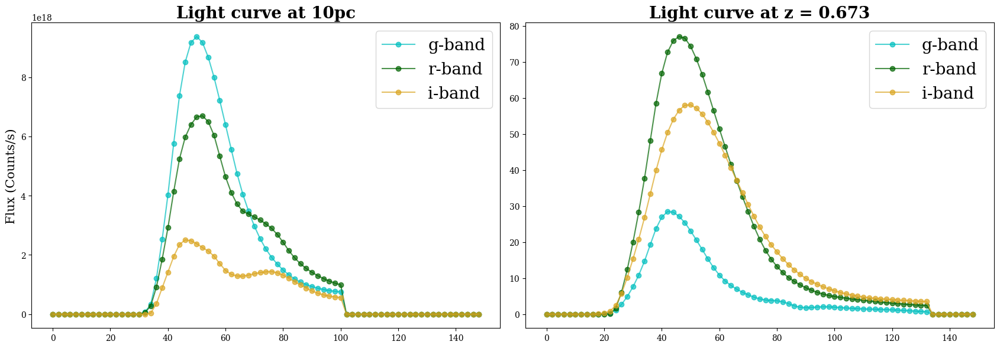

791262938352.2521
791262938352.2521
791262938352.2521
4.886500606166038e-06
4.886500606166038e-06
4.886500606166038e-06


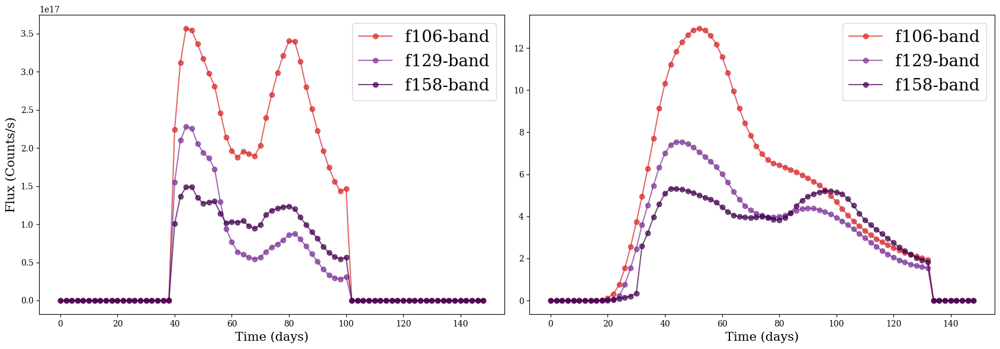

In [12]:
times = np.arange(0, 150, 2) 
band_colors = {
    'g': 'c', 'r': 'darkgreen', 'i': 'goldenrod',
    'f106': '#d62728', 'f129': '#7b3294', 'f158': '#40004b'
}

t_z0_g, f_z0_g = sncosmo_lightcurve(times, 'lsstg', 28.30, z_source=2.369e-9)
t_z0_r, f_z0_r = sncosmo_lightcurve(times, 'lsstr', 28.13, z_source=2.369e-9)
t_z0_i, f_z0_i = sncosmo_lightcurve(times, 'lssti', 27.70, z_source=2.369e-9)
t_zs_g, f_zs_g = sncosmo_lightcurve(times, 'lsstg', 28.30, z_source=z_source)
t_zs_r, f_zs_r = sncosmo_lightcurve(times, 'lsstr', 28.13, z_source=z_source)
t_zs_i, f_zs_i = sncosmo_lightcurve(times, 'lssti', 27.70, z_source=z_source)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 6), sharex=True)
ax1.plot(t_z0_g, f_z0_g, 'o-', label='g-band', color=band_colors['g'], alpha=0.7)
ax1.plot(t_z0_r, f_z0_r, 'o-', label='r-band', color=band_colors['r'], alpha=0.7)
ax1.plot(t_z0_i, f_z0_i, 'o-', label='i-band', color=band_colors['i'], alpha=0.7)
ax1.set_title(f'Light curve at 10pc', fontsize=20, fontweight='bold')
ax1.set_ylabel('Flux (Counts/s)', fontsize=15)
# ax1.set_xlabel('Time (days)', fontsize=15)
ax1.grid(False)
ax1.legend(fontsize=20)

# Plot Right: Actual Source Redshift
ax2.plot(t_zs_g, f_zs_g, 'o-', label='g-band', color=band_colors['g'], alpha=0.7)
ax2.plot(t_zs_r, f_zs_r, 'o-', label='r-band', color=band_colors['r'], alpha=0.7)
ax2.plot(t_zs_i, f_zs_i, 'o-', label='i-band', color=band_colors['i'], alpha=0.7)
ax2.set_title(f'Light curve at z = {z_source:.3f}', fontsize=20, fontweight='bold')
# ax2.set_xlabel('Time (days)', fontsize=15)
ax2.grid(False)
ax2.legend(fontsize=20)

# Add a note about the Y-axis difference if they aren't shared
plt.tight_layout()
# fig.savefig(f"thesis_plots/{system_indx}_lsst_sncosmo_lightcurve.png", bbox_inches='tight')
plt.show()

####################################################################################################
t_z0_g, f_z0_g = sncosmo_lightcurve(times, roman_bands[0], roman_mag_zero_point_g, z_source=2.369e-9)
t_z0_r, f_z0_r = sncosmo_lightcurve(times, roman_bands[1], roman_mag_zero_point_r, z_source=2.369e-9)
t_z0_i, f_z0_i = sncosmo_lightcurve(times, roman_bands[2], roman_mag_zero_point_i, z_source=2.369e-9)
t_zs_g, f_zs_g = sncosmo_lightcurve(times, roman_bands[0], roman_mag_zero_point_g, z_source=z_source)
t_zs_r, f_zs_r = sncosmo_lightcurve(times, roman_bands[1], roman_mag_zero_point_r, z_source=z_source)
t_zs_i, f_zs_i = sncosmo_lightcurve(times, roman_bands[2], roman_mag_zero_point_i, z_source=z_source)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 6), sharex=True)
ax1.plot(t_z0_g, f_z0_g, 'o-', label=roman_bands[0]+'-band', color=band_colors[roman_bands[0]], alpha=0.7)
ax1.plot(t_z0_r, f_z0_r, 'o-', label=roman_bands[1]+'-band', color=band_colors[roman_bands[1]], alpha=0.7)
ax1.plot(t_z0_i, f_z0_i, 'o-', label=roman_bands[2]+'-band', color=band_colors[roman_bands[2]], alpha=0.7)
# ax1.set_title(f'Light curve at 10pc', fontsize=15, fontweight='bold')
ax1.set_ylabel('Flux (Counts/s)', fontsize=15)
ax1.set_xlabel('Time (days)', fontsize=15)
ax1.grid(False)
ax1.legend(fontsize=20)

# Plot Right: Actual Source Redshift
ax2.plot(t_zs_g, f_zs_g, 'o-', label=roman_bands[0]+'-band', color=band_colors[roman_bands[0]], alpha=0.7)
ax2.plot(t_zs_r, f_zs_r, 'o-', label=roman_bands[1]+'-band', color=band_colors[roman_bands[1]], alpha=0.7)
ax2.plot(t_zs_i, f_zs_i, 'o-', label=roman_bands[2]+'-band', color=band_colors[roman_bands[2]], alpha=0.7)
# ax2.set_title(f'Light curve at z = {z_source:.3f}', fontsize=15, fontweight='bold')
ax2.set_xlabel('Time (days)', fontsize=15)
ax2.grid(False)
ax2.legend(fontsize=20)

# Add a note about the Y-axis difference if they aren't shared
plt.tight_layout()
# fig.savefig(f"thesis_plots/{system_indx}_roman_sncosmo_lightcurve.png", bbox_inches='tight')
plt.show()

# Make time variable point source class based on Caskade

Gaussian SN source based on: https://caskade.readthedocs.io/en/latest/notebooks/WorkedExample.html <br>

Star source based on (not being used though): <br>
https://github.com/Ciela-Institute/caustics/blob/main/src/caustics/light/star_source.py <br>
and <br>
https://github.com/Ciela-Institute/caustics/blob/main/src/caustics/light/func/star_source.py

Galaxies are modeled as Sersic sources. Using Caustics Sersic class (no modifications). Source code: <br>
https://github.com/Ciela-Institute/caustics/blob/main/src/caustics/light/sersic.py <br>
and <br>
https://github.com/Ciela-Institute/caustics/blob/main/src/caustics/light/func/sersic.py

In [13]:
## From Caskade example
class TimeVaryingGaussian(caustics.Source):
    '''
    Based on Caskade's Gaussian source code --> in SN lightcurve example 
    q, phi, and sigma values taken and fixed from Caskade example 
        --> What values to use to model a Point Source?
    brightness returns Spacial spread of brightness (copied from Caskade) x Flux (function defined above)
    Multiband --> dictionary of flux functions --> for each band
    Setting simga to 0.03. Is this ok??
    '''
    def __init__(self, x0, y0, lc_funcs, q=1.0, phi=0.0, sigma=0.03, name = "SN",
                ):
        super().__init__(name=name)
        
        # Define parameters (copied from caustic Sersic sources class)
        self.x0 = caustics.Param("x0", x0, units="arcsec")
        self.y0 = caustics.Param("y0", y0, units="arcsec")
        self.q = caustics.Param("q", q, units="unitless")
        self.phi = caustics.Param("phi", phi, units="rad")
        self.sigma = caustics.Param("sigma", sigma, units="arcsec")
        self.lc_funcs = lc_funcs


    @forward
    def brightness(self, x, y, t, band, x0, y0, q, phi, sigma):
        x, y = x - x0, y - y0
        s, c = torch.sin(phi), torch.cos(phi)
        x, y = c * x - s * y, s * x + c * y
        r = (x**2 + (y * q) ** 2).sqrt()
        # Spacial shape based on Caskade example  -- how should we model a point source here ??
        spatial_shape = (-r ** 2 / sigma**2).exp() / (2 * np.pi * sigma**2).sqrt()  #?? --> osource code had sqrt but isnt that wrong??
        flux_at_t = self.lc_funcs[band](t)
        
        return flux_at_t * spatial_shape




## From Caustics StarSource class
## Not using currently
class TimeVaryingStarSource(caustics.Source):
    '''
    Based on Caustics StarSource code: 
    https://github.com/Ciela-Institute/caustics/blob/main/src/caustics/light/func/star_source.py
    https://github.com/Ciela-Institute/caustics/blob/main/src/caustics/lenses/func/__init__.py
    I cut out the gamma part i.e. limb darkening, since anyways assuming 0?
    Added time varying component of flux
    I don't think this really works well; will use gaussian instead, but visualization of this class can be seen below
    '''
    def __init__(self, x0, y0, lc_func, theta_s = 0.03, name = "SN",
                ):
        super().__init__(name=name)
        
        # Define parameters (copied from caustic Sersic sources class)
        self.x0 = caustics.Param("x0", x0, units="arcsec")
        self.y0 = caustics.Param("y0", y0, units="arcsec")
        self.theta_s = Param("theta_s", theta_s, units="arcsec", valid=(0, None))
        
        self.lc_func = lc_func


    @forward
    def brightness(self, x, y, t, x0, y0, theta_s):   
        x, y = utils.translate_rotate(x, y, x0, y0)
        flux_at_t = self.lc_func(t)
        # Calculate the radial distance from the center
        impact_parameter = (x**2 + y**2) ** (1 / 2)
        intensity = where(impact_parameter <= theta_s, flux_at_t, 0) 
        return intensity

# Set parameters values for each source

In [14]:
# Cosmology model
cosmology = caustics.FlatLambdaCDM(name="cosmo")

host_Ie_dict = {"g": 0.3,    "r": 0.5,    "i": 1,
                roman_bands[0]: 0.50, roman_bands[1]: 0.90, roman_bands[2]: 1.00}     
lens_Ie_dict = {"g": 0.53,    "r": 0.54,    "i": 0.55, 
                roman_bands[0]: 0.50, roman_bands[1]: 0.30, roman_bands[2]: 0.15} 
  
# Host galaxy light model
host_light = caustics.Sersic(
    name="hostlight",
    x0 = host_x,              # The x-coordinate of the Sersic source's center [arcsec] - tensor
    y0 = host_y,              # The y-coordinate of the Sersic source's center [arcsec] - tensor
    # q=1 - 0.29,             # The axis ratio of the Sersic source [unitless] - tensor
    # phi=-30 * pi / 180,     # The orientation of the Sersic source (position angle) [radians] - tensor
    angle_system="e1_e2",     # change angle system since I have e from Goldstein and used e1, e2 in Lenstronomy??
    e1 = host_e1,             # e1, e2 calculated using Galsimn
    e2 = host_e2,
    n = host_n,               # The Sersic index [unnitless] - tensor
    Re =  host_reff,          # The scale length of the Sersic source [arcesc] - tensor
    Ie = host_Ie_dict["g"],   # The intensity at the effective radius [flux] - tensor
)

# Lens Light model
lens_light = caustics.Sersic(
    name="lens",
    x0 = lens_x,
    y0 = lens_y,
    # q = 1 - 0.29,
    # phi = -30 * pi / 180,
    angle_system = "e1_e2",     
    e1 = lens_e1,            
    e2 = lens_e2,
    n = lens_n,
    Re = lens_reff,
    Ie = torch.tensor(lens_Ie_dict["g"]),
)


# Lens mass model
lens_mass = caustics.SIE(
    name="sie",
    cosmology=cosmology,
    z_s = z_source,                                          # The redshift of the source.
    z_l = z_lens,                                            # The redshift of the lens.
    x0 = torch.tensor(lens_x, dtype=torch.float32),          # The x-coordinate of the lens center. [arcsec]
    y0 = torch.tensor(lens_y, dtype=torch.float32),          # The y-coordinate of the lens center.[arcsec]
    # q=1 / 1.14,
    # phi=pi / 2 + 1.6755160819145565,
    Rein = torch.tensor(theta_E, dtype=torch.float32),       # The Einstein radius of the lens. [arcsec]
    angle_system = "e1_e2", 
    e1 = lens_e1,            
    e2 = lens_e2,
)


# SN light model
sn_light = TimeVaryingGaussian(
    name="SN",
    x0 = torch.tensor(sn_x, dtype=torch.float32),              
    y0 = torch.tensor(sn_y, dtype=torch.float32),
    lc_funcs={"g": lsst_sn_lc_func_g, "r": lsst_sn_lc_func_r, "i": lsst_sn_lc_func_i,
              roman_bands[0]: roman_sn_lc_func_g, roman_bands[1]: roman_sn_lc_func_r, roman_bands[2]: roman_sn_lc_func_i}
)


# SN Alternative light model
sn_light_alt = TimeVaryingStarSource(
    name="SN",
    x0 = sn_x,              
    y0 = sn_y,
    lc_func = lsst_sn_lc_func_g
)


# We are simulating (not fitting) — freeze all parameters
host_light.to_static(local_only=False)
lens_light.to_static(local_only=False)
sn_light.to_static(local_only=False)


# Rubin/LSST PSF and image resolution
lsst_psf_dict = {}
bands = ["g","r","i"]
lsst_seeings = [lsst_seeing_g, lsst_seeing_r, lsst_seeing_i]
lsst_n_psfs = [lsst_n_psf_g, lsst_n_psf_r, lsst_n_psf_i]

for band, fwhm, lsst_n_psf in zip(bands, lsst_seeings, lsst_n_psfs):
    lsst_psf_sigma = fwhm / (2 * np.sqrt(2 * np.log(2)))
    
    lsst_psf_dict[band] = caustics.utils.gaussian(
        nx=lsst_n_psf, 
        ny=lsst_n_psf, 
        pixelscale = lsst_pixel_scale, 
        sigma=lsst_psf_sigma, 
        upsample=1
    )


# Roman PSF and image resolution
roman_psf_dict = {}
roman_seeings = [roman_seeing_g, roman_seeing_r, roman_seeing_i]
roman_n_psfs = [roman_n_psf_g, roman_n_psf_r, roman_n_psf_i]

for band, fwhm, roman_n_psf in zip(roman_bands, roman_seeings, roman_n_psfs):
    roman_psf_sigma = fwhm / (2 * np.sqrt(2 * np.log(2)))

    sigma_pixels = roman_psf_sigma / roman_pixel_scale
    print(sigma_pixels)  # e.g. 0.037 / 0.11 ≈ 0.34 pixels
    
    roman_psf_dict[band] = caustics.utils.gaussian(
        nx=lsst_n_psf, 
        ny=lsst_n_psf,   # Set them all (both Rubin and Roman) to 17 (i.e. actual Rubin value) for now
        pixelscale = roman_pixel_scale, 
        sigma=roman_psf_sigma, 
        upsample=1
    )


0.3358681664775348
0.40921868559331825
0.49415086562212024


# Visualize scene before lensing

In [15]:
# show_starsource = False         # Compare StarSource and Gaussian version of SN?
# bands = ["g", "r", "i"]         # rows
# shared_across_bands = True      # make flux range shared accross all bands and sources?
# def to_np(x):
#     return x.detach().cpu().numpy()

# def components_at_time(t, band):
#     '''
#     return fluxes of all sources to be visualized
#     '''
#     host_light.Ie.value = torch.tensor(host_Ie_dict[band])
#     lens_light.Ie.value = torch.tensor(lens_Ie_dict[band])
    
#     host = host_light.brightness(imgx, imgy)
#     lens = lens_light.brightness(imgx, imgy)
#     sn   = sn_light.brightness(imgx, imgy, t, band)
#     total = host + sn
    
#     if show_starsource:
#         sn_alt = sn_light_alt.brightness(imgx, imgy, t)
#         return host, lens, sn, sn_alt, total
    
#     return host, lens, sn, total


# # --- Setup Grid ---
# # times = torch.arange(0, 130, 1, dtype=torch.float32)
# times = torch.tensor([50], dtype=torch.float32)
# B = len(times)
# imgsize = 100
# fov = 5.0

# imgx, imgy = torch.meshgrid(
#     torch.linspace(-fov/2, fov/2, imgsize),
#     torch.linspace(-fov/2, fov/2, imgsize),
#     indexing="xy"
# )


# num_cols = 5 if show_starsource else 4
# fig, axes = plt.subplots(len(bands), num_cols, figsize=(4 * num_cols, 4 * len(bands)), constrained_layout=True)
# if len(bands) == 1:
#     axes = axes[None, :]

# col_titles = (["Host", "Lens", "SN (Gaussian)", "SN (StarSource)", "SN+Host"] if show_starsource else ["Host", "Lens", "SN", "SN+Host"])

# t0 = times[0]
# if shared_across_bands:
#     all_frames = []
#     for b in bands:
#         res0 = components_at_time(t0, b)
#         all_frames.extend([to_np(r) for r in res0])
#     stack0 = np.stack(all_frames, axis=0)
#     vmin_global, vmax_global = np.percentile(stack0, [1, 99.9])
#     vlims = {b: (vmin_global, vmax_global) for b in bands}
# else:
#     vlims = {}
#     for b in bands:
#         res0 = components_at_time(t0, b)
#         stack0 = np.stack([to_np(r) for r in res0], axis=0)
#         vmin, vmax = np.percentile(stack0, [1, 99.9])
#         vlims[b] = (vmin, vmax)


# imgs = {}  # (band, col)
# for r, b in enumerate(bands):
#     res0 = components_at_time(t0, b)
#     vmin, vmax = vlims[b]
#     for c, (ax, frame) in enumerate(zip(axes[r], res0)):
#         im = ax.imshow(to_np(frame), origin="lower", vmin=vmin, vmax=vmax)
#         imgs[(b, c)] = im
#         if r == 0:
#             ax.set_title(col_titles[c])
#     axes[r, 0].set_ylabel(b, fontsize=14, rotation=0, labelpad=35, va="center")
# time_text = fig.suptitle(f"t = {t0.item():.2f} ")

# def update(i):
#     t = times[i]
#     for b in bands:
#         res = components_at_time(t, b)
#         for c, fr in enumerate(res):
#             imgs[(b, c)].set_data(to_np(fr))
#     time_text.set_text(f"t = {t.item():.2f}")
#     return []


# ani = animation.FuncAnimation(fig, update, frames=B, interval=60, blit=False)
# # ani.save("unlensed_system_"+str(system_indx)+"_28_02_26_fainter.gif", writer="pillow", fps=10)
# plt.close(fig)
# HTML(ani.to_jshtml())

In [16]:
# import numpy as np
# import torch
# import matplotlib.pyplot as plt
# from matplotlib import animation
# from IPython.display import HTML

# # --- Configuration ---
# show_starsource = False
# imgsize = 50
# fov = 5.0
# rgb_bands = ["i", "r", "g"] # Mapping: i -> Red, r -> Green, g -> Blue
# num_cols = 5 if show_starsource else 4
# col_titles = ["Host", "Lens", "SN", "SN+Host"]
# if show_starsource:
#     col_titles = ["Host", "Lens", "SN (G)", "SN (S)", "SN+Host"]

# def to_np(x):
#     return x.detach().cpu().numpy()

# # --- RGB Helper ---
# def get_rgb_row(t):
#     """
#     Stacks components into RGB: [i-band, r-band, g-band]
#     Returns a list of RGB arrays, one for each column.
#     """
#     # 1. Get components for all three bands
#     # res_dict[band] = (host, lens, sn, [sn_alt], total)
#     res_dict = {b: components_at_time(t, b) for b in rgb_bands}
    
#     rgb_components = []
#     for c in range(num_cols):
#         # Stack i, r, g for this specific column
#         # result is (Height, Width, 3)
#         layers = [to_np(res_dict[b][c]) for b in rgb_bands]
#         rgb_stack = np.stack(layers, axis=-1)
#         rgb_components.append(rgb_stack)
    
#     return rgb_components

# # --- Setup Plot ---
# fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4), constrained_layout=True)
# t0 = times[0]

# # --- Global Scaling ---
# # We use the 'Total' image at t0 to set the brightness scale for all columns
# # This ensures colors are physically consistent
# res_t0 = get_rgb_row(t0)
# total_idx = -1
# vmax_global = np.percentile(res_t0[total_idx], 99.9) 

# imgs_plots = []
# for c in range(num_cols):
#     # Normalize by vmax and clip to [0, 1] for imshow
#     data = np.clip(res_t0[c] / vmax_global, 0, 1)
#     im = axes[c].imshow(data, origin="lower")
#     imgs_plots.append(im)

#     axes[c].set_xlim(30, 70)
#     axes[c].set_ylim(30, 70)
    
#     axes[c].set_title(col_titles[c])
#     axes[c].axis('off')


# time_text = fig.suptitle(f"t = {t0.item():.2f} | RGB: (i, r, g)")

# # --- Animation ---
# def update(i):
#     t = times[i]
#     # Ensure t is a tensor for your internal interpolation logic
#     t_tensor = torch.as_tensor(t, dtype=torch.float32)
    
#     new_row = get_rgb_row(t_tensor)
#     for c in range(num_cols):
#         data = np.clip(new_row[c] / vmax_global, 0, 1)
#         imgs_plots[c].set_data(data)
    
#     time_text.set_text(f"t = {t.item():.2f} | RGB: (i, r, g)")
#     return imgs_plots


# # fig.savefig(f"rgb_system_{system_indx}_t{t0.item():.1f}.png", dpi=300, bbox_inches='tight', facecolor='white')
# ani = animation.FuncAnimation(fig, update, frames=len(times), interval=60, blit=False)
# plt.close(fig)
# HTML(ani.to_jshtml())

In [ ]:
show_starsource = False         # Compare StarSource and Gaussian version of SN?
bands = ["g", "r", "i"]         # [Blue, Green, Red] channels
# bands = roman_bands         # [Blue, Green, Red] channels
shared_across_bands = True      # use a single global vmax across all components?

def to_np(x):
    return x.detach().cpu().numpy()

def components_at_time(t, band):
    '''
    return fluxes of all sources to be visualized
    '''
    host_light.Ie.value = torch.tensor(host_Ie_dict[band])
    lens_light.Ie.value = torch.tensor(lens_Ie_dict[band])
    
    host = host_light.brightness(imgx, imgy)
    lens = lens_light.brightness(imgx, imgy)
    sn   = sn_light.brightness(imgx, imgy, t, band)
    total = host + sn + lens
    
    if show_starsource:
        sn_alt = sn_light_alt.brightness(imgx, imgy, t)
        return host, lens, sn, sn_alt, total
    
    return host, lens, sn, total

def get_linear_rgb(frames_per_band, vmax):
    """
    frames_per_band: list of 3 2D arrays ordered [g, r, i]
    Maps i -> R, r -> G, g -> B (short=blue, mid=green, long=red)
    """
    rgb = np.stack([
        frames_per_band[2],   # i-band -> Red
        frames_per_band[1],   # r-band -> Green
        frames_per_band[0],   # g-band -> Blue
    ], axis=-1)
    return np.clip(rgb / vmax, 0, 1)

def components_rgb_at_time(t):
    """
    Returns a list of RGB images, one per component column.
    Each RGB image has shape (H, W, 3).
    """
    # Collect per-band results: band_results[band_idx] = tuple of component arrays
    band_results = [components_at_time(t, b) for b in bands]
    num_components = len(band_results[0])
    
    rgb_images = []
    for c in range(num_components):
        frames_per_band = [to_np(band_results[bi][c]) for bi in range(len(bands))]
        rgb_images.append(frames_per_band)  # store raw for vmax computation
    return rgb_images  # list of [g_arr, r_arr, i_arr] per component

# --- Setup Grid ---
times = torch.tensor([50], dtype=torch.float32)
B = len(times)
imgsize = 100
fov = 2.0
imgx, imgy = torch.meshgrid(
    torch.linspace(-fov/2, fov/2, imgsize),
    torch.linspace(-fov/2, fov/2, imgsize),
    indexing="xy"
)

col_titles = (["Host", "Lens", "SN (Gaussian)", "SN (StarSource)", "Unlensed Scene"]
              if show_starsource else ["Host", "Lens", "SN", "Unlensed Scene"])
num_cols = len(col_titles)

# --- Compute vmax ---
t0 = times[0]
raw_components_t0 = components_rgb_at_time(t0)  # list of [g,r,i] per component

if shared_across_bands:
    all_data = np.concatenate([np.stack(c) for c in raw_components_t0])
    vmax_global = np.percentile(all_data, 99.9)
    vmaxes = [vmax_global] * num_cols
else:
    vmaxes = [np.percentile(np.stack(c), 99.9) for c in raw_components_t0]

# --- Setup Figure ---
fig, axes = plt.subplots(1, num_cols, figsize=(4 * num_cols, 4), constrained_layout=True)

imgs = {}
for c, (ax, frames_per_band) in enumerate(zip(axes, raw_components_t0)):
    rgb = get_linear_rgb(frames_per_band, vmaxes[c])
    im = ax.imshow(rgb, origin="lower", interpolation='bicubic')
    imgs[c] = im
    ax.set_title(col_titles[c], fontweight="bold", size = 25)
    ax.axis('off')

time_text = fig.suptitle(f"t = {t0.item():.2f}", size = 20)

# --- Animation ---
def update(i):
    t = times[i]
    raw_components = components_rgb_at_time(t)
    for c, frames_per_band in enumerate(raw_components):
        rgb = get_linear_rgb(frames_per_band, vmaxes[c])
        imgs[c].set_data(rgb)
    time_text.set_text(f"t = {t.item():.2f}")
    return list(imgs.values())

# fig.savefig(f"{extra_path}{system_indx}_results/{date}/rgb_lsst_system_{system_indx}_t{t0.item():.1f}_{date}.png", dpi=300, bbox_inches='tight', facecolor='white')
ani = animation.FuncAnimation(fig, update, frames=B, interval=60, blit=False)
plt.close(fig)
HTML(ani.to_jshtml())

# Build simulator - Caustics

In [16]:
class Singlelens(Module):
    def __init__(self, lens_mass, lens_light, host_light, sn_light, band_keys,
                 host_Ie_dict, lens_Ie_dict,
                 pixelscale, pixels_x, upsample_factor, psf_dict=None,
                 name: str = "sim"
                ):
        super().__init__(name)

        self.lens = lens_mass
        self.src_host = host_light
        self.src_sn = sn_light
        self.lens_light = lens_light

        self.host_Ie_dict = host_Ie_dict
        self.lens_Ie_dict = lens_Ie_dict
        self.band_keys = band_keys
        self.psf_dict = psf_dict
        self.upsample_factor = upsample_factor

        # Create the high-resolution grid
        theta_x, theta_y = caustics.utils.meshgrid(
            pixelscale / upsample_factor,  
            upsample_factor * pixels_x,    
            dtype=torch.float32,
        )
        # theta_x and theta_y --> lens plane coorindates
        self.theta_x = theta_x
        self.theta_y = theta_y

        self.pixels_x = pixels_x
        self.pixelscale = pixelscale

    @forward
    def run_simulator(self, times, psf_dict):
        # Ray-trace to get the lensed positions --> same for SN and host (since at same z_source)
        bx, by = self.lens.raytrace(self.theta_x, self.theta_y)          # bx and by --> source plane coordinates

        # Calculate the SN time delays 
        td = self.lens.time_delay(self.theta_x, self.theta_y)    #time delay grid of tds of each pixel

        # Get exact time delays at SN image coords
        beta_x_sn = self.src_sn.x0.value   # source plane coord of SN
        beta_y_sn = self.src_sn.y0.value   # source plane coord of SN
        theta_x_sn, theta_y_sn = self.lens.forward_raytrace(beta_x_sn, beta_y_sn) # get lens plane coords of SN ie coords of SN images
        
        
        # SN-SN separation
        dx_sn = theta_x_sn[0] - theta_x_sn[1]
        dy_sn = theta_y_sn[0] - theta_y_sn[1]
        sep_sn_sn = torch.sqrt(dx_sn**2 + dy_sn**2)
        print(f"SN-SN separation: {sep_sn_sn:.4f} arcsec")
        
        # SN to lens center
        lens_x = self.lens.x0.value
        lens_y = self.lens.y0.value
        sep_sn0_lens = torch.sqrt((theta_x_sn[0] - lens_x)**2 + (theta_y_sn[0] - lens_y)**2)
        sep_sn1_lens = torch.sqrt((theta_x_sn[1] - lens_x)**2 + (theta_y_sn[1] - lens_y)**2)
        print(f"SN image 0 to lens: {sep_sn0_lens:.4f} arcsec")
        print(f"SN image 1 to lens: {sep_sn1_lens:.4f} arcsec")
        print(f"Min SN-lens separation: {torch.min(sep_sn0_lens, sep_sn1_lens):.4f} arcsec")
        print(f"Max separation in system: {torch.max(torch.stack([sep_sn_sn, sep_sn0_lens, sep_sn1_lens])):.4f} arcsec")        
        
        # # 1. Find the center in the high-res grid (e.g., 137)
        # high_res_center_x = torch.argmin(torch.abs(self.theta_x[0, :]))
        # high_res_center_y = torch.argmin(torch.abs(self.theta_y[:, 0]))
        
        # # 2. Convert to the downsampled grid (the one you see in Scarlet)
        # # We divide by upsample_factor to "shrink" the index back
        # final_center_x = high_res_center_x.float() / self.upsample_factor
        # final_center_y = high_res_center_y.float() / self.upsample_factor
        
        # print(f"Final 55x55 Image Center: [{final_center_y.item()}, {final_center_x.item()}]")
                
        # # total_width in arcsec (pixels_x * original pixelscale)
        # print('Pixels x:', self.pixels_x)
        # print('pixelscale:', self.pixelscale)
        # total_width = self.pixels_x * self.pixelscale
        # x_pixel_final = (theta_x_sn + (total_width / 2)) / self.pixelscale
        # y_pixel_final = (theta_y_sn + (total_width / 2)) / self.pixelscale
        # print(f" Images Pixel Coords: x={x_pixel_final}, y={y_pixel_final}")
        # print(f" Images Arcsec: x={theta_x_sn}, y={theta_y_sn}")

        
        sn_time_delays = self.lens.time_delay(theta_x_sn, theta_y_sn)  # time delays at SN image coords
        sn_td_relative = sn_time_delays - sn_time_delays.min()   # relative time delay between SN images
        print(f"Delays: {sn_time_delays}")
        print(f"Relative delay: {sn_td_relative}")

        
        images_band = []
        for band in self.band_keys:
            # Get appropriate band Ie value from Ie dictionary
            host_ie = torch.tensor(self.host_Ie_dict[band], device=bx.device, dtype=bx.dtype)
            lens_ie = torch.tensor(self.lens_Ie_dict[band], device=bx.device, dtype=bx.dtype)
            # Get the lens and host galaxy brightness --> only band dependent (Ie), do not change with time
            host_img = self.src_host.brightness(bx, by, Ie=host_ie)                          # Evaluate the lensed source brightness at high resolution
            lens_img = self.lens_light.brightness(self.theta_x, self.theta_y, Ie=lens_ie)    # Add the lens light
            static_light = host_img + lens_img            
            
            images_time = []
            for time in times:
                print(time)
                sn_img = self.src_sn.brightness(bx, by, time-td, band)           # Add lensed SN source brightness at high resolution (time and band dependent)
                
                image = static_light + sn_img  # sum all sources 
    
                # Downsample to the desired resolution
                image_ds = avg_pool2d(image[None, None], self.upsample_factor)[0, 0]
    
                # Convolve with the PSF using conv2d
                psf = self.psf_dict[band]
                psf_normalized = (psf.T / psf.sum())[None, None]
                image_ds = (
                    conv2d(image_ds[None, None], psf_normalized, padding="same")
                    .squeeze(0)
                    .squeeze(0)
                )
                images_time.append(image_ds)
            
            images_band.append(torch.stack(images_time, dim=0))
        
        return torch.stack(images_band, dim=0)



In [27]:
size = 10.0  # width of the image in arc seconds  --> old Lenstronomy code
lsst_numpix = int(round(size / lsst_pixel_scale)) # ---> Copied from ou old Lenstronomy code, written by Charlotte
roman_numpix = int(round(size / roman_pixel_scale))


# Instantiate simulator
roman_simulator = Singlelens(
    lens_mass=lens_mass,
    lens_light=lens_light,
    host_light=host_light,
    sn_light = sn_light,
    band_keys=roman_bands, 
    host_Ie_dict = host_Ie_dict,
    lens_Ie_dict = lens_Ie_dict,
    pixels_x = roman_numpix,
    pixelscale = roman_pixel_scale,
    upsample_factor=5,
    psf_dict=roman_psf_dict,
)
lsst_simulator = Singlelens(
    lens_mass=lens_mass,
    lens_light=lens_light,
    host_light=host_light,
    sn_light = sn_light,
    band_keys=["g","r","i"],
    host_Ie_dict = host_Ie_dict,
    lens_Ie_dict = lens_Ie_dict,
    pixels_x = lsst_numpix,                
    pixelscale=lsst_pixel_scale,
    upsample_factor=5,                
    psf_dict=lsst_psf_dict,
)
# Set all parameters to be dynamic
roman_simulator.to_dynamic(local_only=False)
lsst_simulator.to_dynamic(local_only=False)
cosmology.to_static()  # except cosmology parameters

In [28]:
print(lsst_simulator)

sim|Singlelens
    sie|SIE
        cosmo|FlatLambdaCDM
            h0|static: 0.677
            critical_density_0|static: 1.27e+11
            Om0|static: 0.31
        z_s|static: 0.694
        z_l|static: 0.0297
        x0|static: 0
        y0|static: 0
        q|pointer: 0.949
            e1|dynamic: -0.019
            e2|dynamic: 0.0176
        phi|pointer: 1.2
            e1|dynamic: -0.019
            e2|dynamic: 0.0176
        Rein|static: 1.7
        e1|dynamic: -0.019
        e2|dynamic: 0.0176
    hostlight|Sersic
        x0|static: 0.971
        y0|static: -0.36
        q|pointer: 0.818
            e1|static: 0.0281
            e2|static: 0.096
        phi|pointer: 0.643
            e1|static: 0.0281
            e2|static: 0.096
        n|static: 1
        Re|static: 1.08
        Ie|static: 1
        e1|static: 0.0281
        e2|static: 0.096
    SN|TimeVaryingGaussian
        x0|static: -0.294
        y0|static: -0.554
        q|static: 1
        phi|static: 0
        sigma

# Run Simulator

In [29]:
# Now create a flattened tensor
roman_params_for_simulator = roman_simulator.get_values()
print("Roman Params tensor shape: ", roman_params_for_simulator.shape)
roman_params_for_simulator = roman_simulator.get_values().float()   # Force all parameters to float32 (got mismatch error earlier)

lsst_params_for_simulator = lsst_simulator.get_values()
print("LSST Params tensor shape: ", lsst_params_for_simulator.shape)
lsst_params_for_simulator = lsst_simulator.get_values().float()   # Force all parameters to float32 (got mismatch error earlier)


roman_lensed_images = []
lsst_lensed_images = []
obs_times = torch.arange(0, 150, 2, dtype=torch.float32)
obs_times = torch.tensor([50], dtype=torch.float32)

roman_lensed_images = roman_simulator.run_simulator(roman_params_for_simulator, times=obs_times, psf_dict=roman_psf_dict)
lsst_lensed_images = lsst_simulator.run_simulator(lsst_params_for_simulator, times=obs_times, psf_dict=lsst_psf_dict)



Roman Params tensor shape:  torch.Size([2])
LSST Params tensor shape:  torch.Size([2])
SN-SN separation: 3.3700 arcsec
SN image 0 to lens: 2.3124 arcsec
SN image 1 to lens: 1.0578 arcsec
Min SN-lens separation: 1.0578 arcsec
Max separation in system: 3.3700 arcsec
Delays: tensor([-9.5575, -1.3997])
Relative delay: tensor([0.0000, 8.1578])
tensor(50.)
tensor(50.)
tensor(50.)
SN-SN separation: 3.3700 arcsec
SN image 0 to lens: 2.3124 arcsec
SN image 1 to lens: 1.0578 arcsec
Min SN-lens separation: 1.0578 arcsec
Max separation in system: 3.3700 arcsec
Delays: tensor([-9.5575, -1.3997])
Relative delay: tensor([0.0000, 8.1578])
tensor(50.)
tensor(50.)
tensor(50.)


tensor(0)


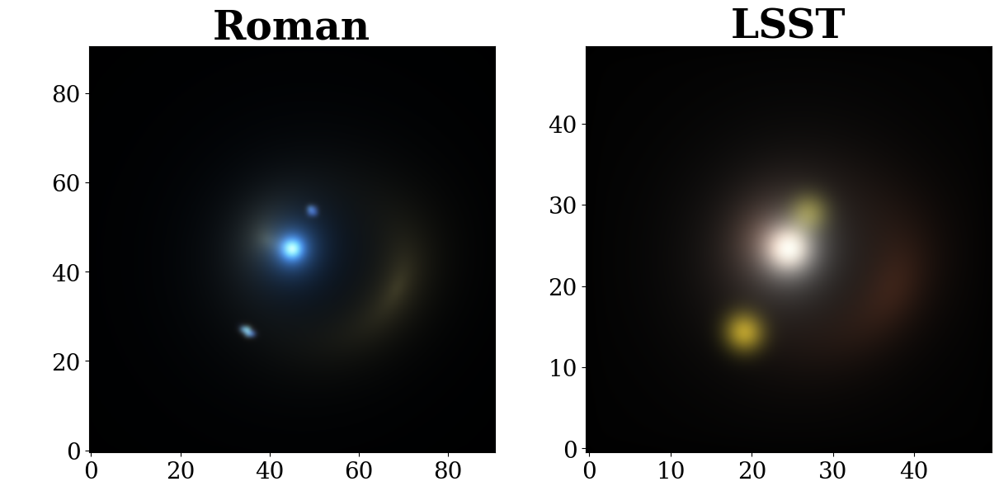

In [32]:
# SINGLE COLOR IMAGE
rom_data = roman_lensed_images.permute(1, 0, 2, 3).detach().cpu().numpy()
lsst_data = lsst_lensed_images.permute(1, 0, 2, 3).detach().cpu().numpy()

time = torch.tensor([0], dtype=torch.float32)
time_idx = np.argmin(np.abs(obs_times - time))
print(time_idx)

# --- Linear Scaling Constants ---
# We calculate a global max for each observatory to keep colors consistent
vmax_rom = np.percentile(rom_data, 99.9)
vmax_lsst = np.percentile(lsst_data, 99.9)

def get_linear_rgb(data_3band, vmax):
    """ Stacks [Short, Mid, Long] into [R, G, B] using linear scaling """
    # Reverse stack: Index 2 (i/F158) -> Red, 1 (r/F129) -> Green, 0 (g/F106) -> Blue
    rgb = np.stack([data_3band[2], data_3band[1], data_3band[0]], axis=-1)
    # Pure linear normalization
    return np.clip(rgb / vmax, 0, 1)

# --- Setup Plot ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

im_rom = axes[0].imshow(get_linear_rgb(rom_data[time_idx], vmax_rom), origin="lower", interpolation='bicubic')
im_lsst = axes[1].imshow(get_linear_rgb(lsst_data[time_idx], vmax_lsst), origin="lower", interpolation='bicubic')

axes[0].set_title(f"t = {time[0]:.2f}", fontsize = 30)

# if time == torch.tensor([50], dtype=torch.float32):
axes[0].set_title("Roman", fontweight="bold", fontsize = 35)
axes[1].set_title("LSST", fontweight="bold", fontsize = 35)


axes[0].set_ylabel(" ", fontweight="bold", fontsize = 35)
axes[1].set_ylabel(" ", fontweight="bold", fontsize = 35)

for ax in axes:
    ax.tick_params(axis='both', which='major', labelsize=20) # Change 20 to your preferred size

# for ax in axes:
#     # ax.axis('off')
#     ax.set_xticks([])
#     ax.set_yticks([])

imgs_plots = [im_rom, im_lsst]
# time_text = fig.suptitle(f"t = {time[0]:.2f}")

fig.savefig(f"thesis_plots/rgb_lensed_system_{system_indx}_t{time.item():.1f}_{date}_horizontal.png", dpi=300, bbox_inches='tight', facecolor='white')
plt.show()




# Animate results

In [22]:
## INDIVIDUAL BAND SIMS
# # Transpose the images so they are (Time, Band, H, W) instead of (Band, Time, H, W)
roman_lensed_images_plot = roman_lensed_images.permute(1, 0, 2, 3)
lsst_lensed_images_plot = lsst_lensed_images.permute(1, 0, 2, 3)


N_obs = len(obs_times)
imgs = []
lsst_bands = ['g', 'r', 'i']

# Flatten all images to find the overall min/max
# We use 99.9th percentile to avoid a single "hot pixel" stretching the scale too much
# all_data_combined = torch.cat([roman_lensed_images.flatten(), lsst_lensed_images.flatten()])
# all_data_np = all_data_combined.detach().cpu().numpy()
# vmin_global = np.percentile(all_data_np, 0.1)  # Or just 0 if you want to baseline at zero
# vmax_global = np.percentile(all_data_np, 99.9) # Avoids saturation from rare artifacts
roman_np = roman_lensed_images.detach().cpu().numpy()
vmin_roman = np.percentile(roman_np, 0.1)
vmax_roman = np.percentile(roman_np, 99.9)
lsst_np = lsst_lensed_images.detach().cpu().numpy()
vmin_lsst = np.percentile(lsst_np, 0.1)
vmax_lsst = np.percentile(lsst_np, 99.9)


fig, axes = plt.subplots(2, 3, figsize=(12, 8), constrained_layout=True)

# INITIAL ANIMATION FRAME
# --- Row 0: Roman ---
title = fig.suptitle(f"t = {obs_times[0]}")

axes[0, 0].set_ylabel("Roman", fontsize=14, fontweight="bold", rotation=0, labelpad=35, va="center")
for j, b in enumerate(roman_bands):
    ax = axes[0, j]
    im_roman = ax.imshow(roman_lensed_images_plot[0][j].detach().cpu().numpy(), origin="lower", vmin=vmin_roman, vmax=vmax_roman)
    ax.set_title(b)
    imgs.append(im_roman)

# --- Row 1: LSST ---
axes[1, 0].set_ylabel("LSST", fontsize=14, fontweight="bold", rotation=0, labelpad=35, va="center")
for j, b in enumerate(lsst_bands):
    ax = axes[1, j]
    im_lsst = ax.imshow(lsst_lensed_images_plot[0][j].detach().cpu().numpy(), origin="lower", vmin=vmin_lsst, vmax=vmax_lsst)
    ax.set_title(b)
    imgs.append(im_lsst)


# UPDATE ANIMATION FRAMES
def update(i):
    # Roman (first 3 imgs)
    for j in range(3):
        imgs[j].set_data(roman_lensed_images_plot[i][j].detach().cpu().numpy())
    # LSST (next 3 imgs)
    for j in range(3):
        imgs[3 + j].set_data(lsst_lensed_images_plot[i][j].detach().cpu().numpy())

    title.set_text(f" t = {obs_times[i]}")
    return imgs

fig.colorbar(imgs[0], ax=axes, orientation='vertical', fraction=0.02, pad=0.04, label='Flux ($e^-/s$)')

ani = animation.FuncAnimation(fig, update, frames=N_obs, interval=100, blit=False)
# ani.save(f'{str(system_indx)}_results/lensed_system_{str(system_indx)}_{date}.gif', writer="pillow", fps=10)
plt.close(fig)
HTML(ani.to_jshtml())

In [23]:
# COLOR SIM
rom_data = roman_lensed_images.permute(1, 0, 2, 3).detach().cpu().numpy()
lsst_data = lsst_lensed_images.permute(1, 0, 2, 3).detach().cpu().numpy()

# --- Linear Scaling Constants ---
# We calculate a global max for each observatory to keep colors consistent
vmax_rom = np.percentile(rom_data, 99.9)
vmax_lsst = np.percentile(lsst_data, 99.9)

def get_linear_rgb(data_3band, vmax):
    """ Stacks [Short, Mid, Long] into [R, G, B] using linear scaling """
    # Reverse stack: Index 2 (i/F158) -> Red, 1 (r/F129) -> Green, 0 (g/F106) -> Blue
    rgb = np.stack([data_3band[2], data_3band[1], data_3band[0]], axis=-1)
    
    # Pure linear normalization
    return np.clip(rgb / vmax, 0, 1)

# --- Setup Plot ---
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)

# Initial frames using the global linear max
im_rom = axes[0].imshow(get_linear_rgb(rom_data[0], vmax_rom), origin="lower", interpolation='bicubic')
im_lsst = axes[1].imshow(get_linear_rgb(lsst_data[0], vmax_lsst), origin="lower", interpolation='bicubic')

axes[0].set_title("Roman Linear RGB", fontweight="bold")
axes[1].set_title("LSST Linear RGB", fontweight="bold")

for ax in axes:
    ax.axis('off')

imgs_plots = [im_rom, im_lsst]
time_text = fig.suptitle(f"t = {obs_times[0]:.2f}")

# --- Animation ---
def update(i):
    imgs_plots[0].set_data(get_linear_rgb(rom_data[i], vmax_rom))
    imgs_plots[1].set_data(get_linear_rgb(lsst_data[i], vmax_lsst))
    
    time_text.set_text(f"t = {obs_times[i]:.2f}")
    return imgs_plots


# fig.savefig(f"{system_indx}_results/rgb_lensed_system_{system_indx}_t{t0.item():.1f}_{date}.png", dpi=300, bbox_inches='tight', facecolor='white')
ani = animation.FuncAnimation(fig, update, frames=len(obs_times), interval=100, blit=False)
ani.save(f"{extra_path}{system_indx}_results/{date}/rgb_lensed_system_{system_indx}_{date}.gif", writer="pillow", fps=10)
plt.close(fig)
HTML(ani.to_jshtml())

tensor(0)


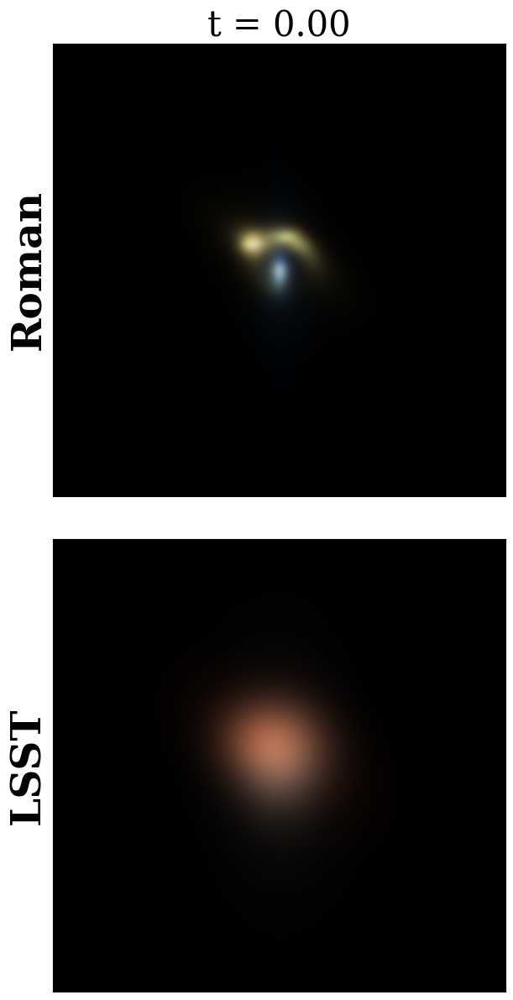

In [29]:
# SINGLE COLOR IMAGE
rom_data = roman_lensed_images.permute(1, 0, 2, 3).detach().cpu().numpy()
lsst_data = lsst_lensed_images.permute(1, 0, 2, 3).detach().cpu().numpy()

time = torch.tensor([0], dtype=torch.float32)
time_idx = np.argmin(np.abs(obs_times - time))
print(time_idx)

# --- Linear Scaling Constants ---
# We calculate a global max for each observatory to keep colors consistent
vmax_rom = np.percentile(rom_data, 99.9)
vmax_lsst = np.percentile(lsst_data, 99.9)

def get_linear_rgb(data_3band, vmax):
    """ Stacks [Short, Mid, Long] into [R, G, B] using linear scaling """
    # Reverse stack: Index 2 (i/F158) -> Red, 1 (r/F129) -> Green, 0 (g/F106) -> Blue
    rgb = np.stack([data_3band[2], data_3band[1], data_3band[0]], axis=-1)
    # Pure linear normalization
    return np.clip(rgb / vmax, 0, 1)

# --- Setup Plot ---
fig, axes = plt.subplots(2, 1, figsize=(6, 12), constrained_layout=True)

im_rom = axes[0].imshow(get_linear_rgb(rom_data[time_idx], vmax_rom), origin="lower", interpolation='bicubic')
im_lsst = axes[1].imshow(get_linear_rgb(lsst_data[time_idx], vmax_lsst), origin="lower", interpolation='bicubic')

axes[0].set_title(f"t = {time[0]:.2f}", fontsize = 30)

if time == torch.tensor([0], dtype=torch.float32):
    axes[0].set_ylabel("Roman", fontweight="bold", fontsize = 35)
    axes[1].set_ylabel("LSST", fontweight="bold", fontsize = 35)
else:
    axes[0].set_ylabel(" ", fontweight="bold", fontsize = 35)
    axes[1].set_ylabel(" ", fontweight="bold", fontsize = 35)

for ax in axes:
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

imgs_plots = [im_rom, im_lsst]
# time_text = fig.suptitle(f"t = {time[0]:.2f}")

fig.savefig(f"{extra_path}{system_indx}_results/rgb_lensed_system_{system_indx}_t{time.item():.1f}_{date}.png", dpi=300, bbox_inches='tight', facecolor='white')
plt.show()




# Plot lensed SN lightcurves
L(t) = sncosmo lightcurve (t-td) $\cdot \mu$ 

tensor([0.9098, 1.5325], dtype=torch.float64)
tensor([  2.7324, -16.2678])
tensor([19.0002,  0.0000])


/tmp/ipykernel_3256622/2268966043.py:26: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_tensor = torch.tensor(obs_times, dtype=torch.float32)


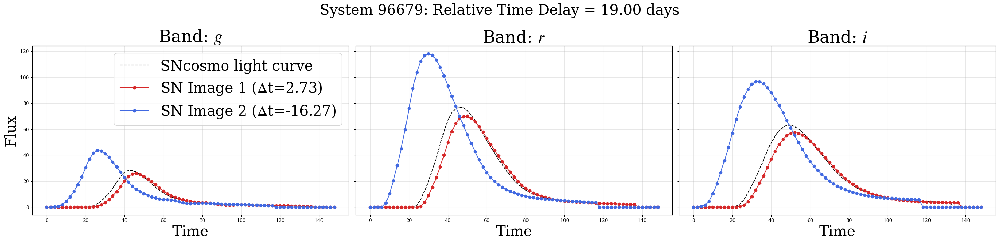

In [30]:
# Run forward raytracing to get magnifications and time delays of SN coords (unlensed, source plane)
roman_simulator.lens.to_static()
roman_simulator.src_sn.to_static()
roman_simulator.to(dtype=torch.float32)

beta_x = torch.tensor(roman_simulator.src_sn.x0.value.item(), dtype=torch.float32)
beta_y = torch.tensor(roman_simulator.src_sn.y0.value.item(), dtype=torch.float32)    # print(f"Type: {beta_x.dtype}, Shape: {beta_x.shape}")
th_x, th_y = roman_simulator.lens.forward_raytrace(beta_x, beta_y)
mu = roman_simulator.lens.magnification(th_x, th_y)
print(mu)
td = roman_simulator.lens.time_delay(th_x, th_y)
print(td)
td_rel = td - td.min() # Relative delays
print(td_rel)


plot_telesctope = 'lsst'
if plot_telesctope == 'lsst':
    bands = ['g', 'r', 'i']
    sn_lc_funcs= [lsst_sn_lc_func_g, lsst_sn_lc_func_r, lsst_sn_lc_func_i]
elif plot_telesctope == 'roman':
    bands = roman_bands
    sn_lc_funcs= [roman_sn_lc_func_g, roman_sn_lc_func_r, roman_sn_lc_func_i]


t_tensor = torch.tensor(obs_times, dtype=torch.float32)

# Plots
colors = ['tab:red', 'royalblue']
fig, axes = plt.subplots(1, 3, figsize=(29, 7), sharey=True)

for ax, band, lc_func in zip(axes, bands, sn_lc_funcs):
    ax.set_title(f"Band: ${band}$", size = 35)
    
    sncosmo_flux = lc_func(t_tensor)
    ax.plot(obs_times, sncosmo_flux, color= 'black', linestyle = '--', label=f"SNcosmo light curve")

    for i in range(len(th_x)):
        # Magnification * Source_Flux(t - delay)
        t_emit = t_tensor - td[i].item()
        flux_caustics = mu[i].item() * lc_func(t_emit).detach().numpy()
        ax.plot(obs_times, flux_caustics, marker = 'o', color = colors[i], label=f"SN Image {i+1} ($\Delta$t={td[i].item():.2f})")
    
    ax.set_xlabel("Time", fontsize = 30)
    if band == 'g':
        ax.set_ylabel("Flux", fontsize = 30)
    axes[0].legend(fontsize=30)
    ax.grid(alpha=0.3)


max_delay = td_rel.max().item()
fig.suptitle(f"System {system_indx}: Relative Time Delay = {max_delay:.2f} days", fontsize=30, y=1)
plt.tight_layout()

plt.savefig(f'{extra_path}{str(system_indx)}_results/{date}/{str(system_indx)}_caustics_{plot_telesctope}_light_curves_{date}.png')
plt.show()




# Save caustics fluxes

In [31]:
import pickle
import numpy as np
import torch

bands = ['g', 'r', 'i']
sn_lc_funcs = [lsst_sn_lc_func_g, lsst_sn_lc_func_r, lsst_sn_lc_func_i]

t_tensor = torch.tensor(obs_times, dtype=torch.float32)
n_images = len(th_x)

caustics_fluxes = []  # -> list length 3 (bands)

for lc_func in sn_lc_funcs:
    # per band: list length n_epochs, each element is list length n_images
    band_epochs = []
    for t in range(len(obs_times)):
        band_epochs.append([0.0] * n_images)

    for img_indx in range(n_images):
        t_emit = t_tensor - td[img_indx].item()
        flux = mu[img_indx].item() * lc_func(t_emit).detach().cpu().numpy()  # (n_epochs,)
        for t in range(len(obs_times)):
            band_epochs[t][img_indx] = float(flux[t])

    caustics_fluxes.append(band_epochs)

# ---------- SAVE ----------
# version = '_29_03_26'
outpath = f"caustics_fluxes_{system_indx}_{date}.pkl"
with open(outpath, "wb") as f:
    pickle.dump(caustics_fluxes, f)

print("saved:", outpath)
print("shape check:",
      len(caustics_fluxes),                 # 3 bands
      len(caustics_fluxes[0]),              # n_epochs
      len(caustics_fluxes[0][0]))           # n_images


saved: caustics_fluxes_96679_14_04_26.pkl
shape check: 3 75 2


/tmp/ipykernel_3256622/4063902814.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_tensor = torch.tensor(obs_times, dtype=torch.float32)


# Save PSFs 
(PSF dictionaries defined in cell 11 (under **Set parameters values for each source**))

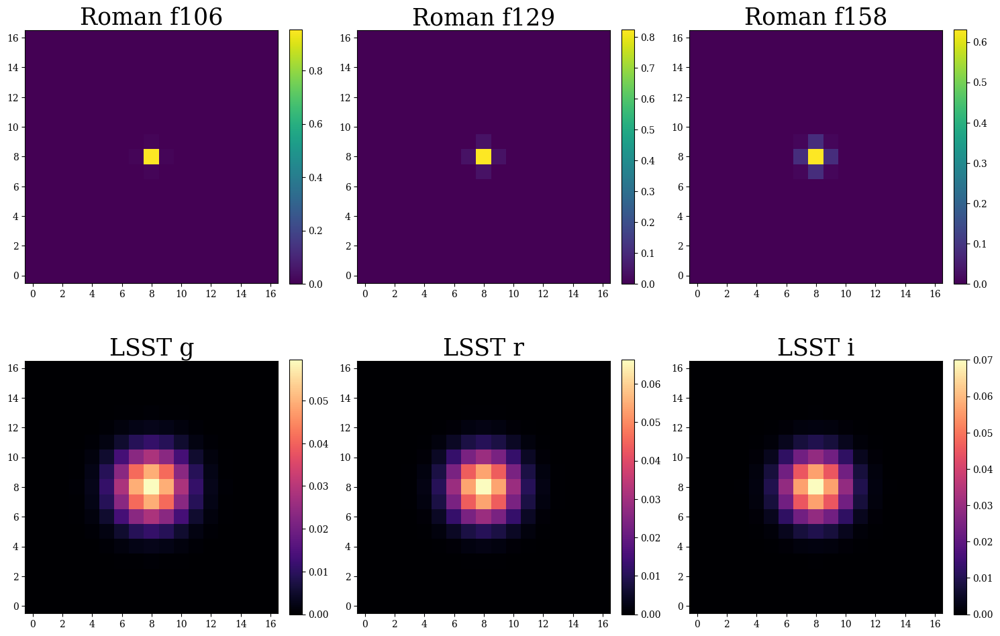

Sum of PSF pixels (should be 1.0):
LSST g:  1.0000
LSST r:  1.0000
LSST i:  1.0000
Roman f106: 1.0000
Roman f129: 1.0000
Roman f158: 1.0000


In [32]:
# Sanity check
fig, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=False, sharey=False)
# Plot Roman PSFs 
for i, band in enumerate(roman_bands):
    data = roman_psf_dict[band].detach().cpu().numpy()
    im = axes[0, i].imshow(data, origin='lower', cmap='viridis')
    # axes[0, i].set_title(f"Roman {band}\n(Shape: {data.shape})")
    axes[0, i].set_title(f"Roman {band}", size = 25)
    fig.colorbar(im, ax=axes[0, i], fraction=0.046, pad=0.04)

# Plot LSST PSFs
for i, band in enumerate(["g", "r", "i"]):
    data = lsst_psf_dict[band].detach().cpu().numpy()
    im = axes[1, i].imshow(data, origin='lower', cmap='magma')
    # axes[1, i].set_title(f"LSST {band}\n(Shape: {data.shape})")
    axes[1, i].set_title(f"LSST {band}", size = 25)
    fig.colorbar(im, ax=axes[1, i], fraction=0.046, pad=0.04)

# plt.suptitle("Roman and LSST PSFs", fontsize=2, fontweight='bold')
plt.tight_layout()
fig.savefig(f"thesis_plots/caustics_PSFs.png", bbox_inches='tight')
plt.show()

# Check for normalization (should all be 1.0)
print("Sum of PSF pixels (should be 1.0):")
for band in ["g", "r", "i"]:
    print(f"LSST {band}:  {lsst_psf_dict[band].sum().item():.4f}")
for band in roman_bands:
    print(f"Roman {band}: {roman_psf_dict[band].sum().item():.4f}")

In [33]:
#Save Roman PSFs
# np.save("PSFs/caustics_gaussian_psf_Roman_"+roman_bands[0]+"_size_17.npy", roman_psf_dict[roman_bands[0]].detach().cpu().numpy())
# np.save("PSFs/caustics_gaussian_psf_Roman_"+roman_bands[1]+"_size_17.npy", roman_psf_dict[roman_bands[1]].detach().cpu().numpy())
# np.save("PSFs/caustics_gaussian_psf_Roman_"+roman_bands[2]+"_size_17.npy", roman_psf_dict[roman_bands[2]].detach().cpu().numpy())

# # Save Rubin PSFs
# np.save("caustics_gaussian_psf_LSST_g_size_17.npy", lsst_psf_dict["g"].detach().cpu().numpy())
# np.save("caustics_gaussian_psf_LSST_r_size_17.npy", lsst_psf_dict["r"].detach().cpu().numpy())
# np.save("caustics_gaussian_psf_LSST_i_size_17.npy", lsst_psf_dict["i"].detach().cpu().numpy())

print("All 6 PSF files have been saved as .npy files.")

All 6 PSF files have been saved as .npy files.


# Add gussian noise based on Lesntronmy

In [34]:
def gaussian_noise_for_model(
    image, 
    readout_noise,   # have read noise param value,     in counts (e.g. e-)?
    exposure_time,   # have exposure time param value,  in seconds?
    sky_brightness,  # have sky brightness param value, in magnitudes/arcsec^2
    pixel_scale,     # have pixel scale param value,    in arcsec
    num_exposures,   # have num exposures param value,  unitless
    magnitude_zero_point,
    seed = None):
    '''
    background_noise: Gaussian sigma of noise level per pixel in counts (e- or ADU) per second.
    Im assuming we're using e- and not ADU???
    '''
    
    # Convert Sky Magnitude to Counts/sec/arcsec^2 (conversion from Lenstronomy)
    sky_brightness_counts_arcsec2 = 10 ** (-(sky_brightness - magnitude_zero_point) / 2.5)

    exposure_time_tot = num_exposures * exposure_time
    readout_noise_tot = num_exposures * readout_noise**2  # square of readout noise
    sky_per_pixel = sky_brightness_counts_arcsec2 * pixel_scale**2
    sky_brightness_tot = exposure_time_tot * sky_per_pixel
    
    sigma_bkg = np.sqrt(readout_noise_tot + sky_brightness_tot) / exposure_time_tot

    g = np.random.RandomState(seed=seed) if seed is not None else np.random
    nx, ny = np.shape(image)
    noise = np.zeros_like(image)
    noise += g.randn(nx, ny) * sigma_bkg
    
    return noise


# Save WCS and images to fits file

In [35]:
from astropy.io import fits
from astropy.wcs import WCS

ra, dec = 0.0, 0.0
# lsst_pixel_scale = 0.2
# roman_pixel_scale = 0.11
storedir = 'outputs/caustics/SNsims/'

def save_caustics_to_fits(images, pixelscale, pixels_x, times, bands, telescope_name):
    
    images_np = images.detach().cpu().numpy()   # Shape: (num_times, num_bands, height, width)
    
    params = telescope_params[telescope_name]
    
    if not os.path.exists(f'{storedir}img_{str(system_indx)}/fixed_rgb/'):
        os.mkdir(f'{storedir}img_{str(system_indx)}/fixed_rgb/')
    
    dir_path = f'{storedir}img_{str(system_indx)}/fixed_rgb/'
    
    # Loop through times and bands to save individual FITS files
    for indt, time in enumerate(times):
        time_str = f"{time.item()}"
        for indb, band in enumerate(bands):
            
            data = images_np[indt, indb] # Shape (H, W)

            # --- ADD NOISE  ---
            noise_map = gaussian_noise_for_model(
                image = data,
                readout_noise = params['read_noise'],
                exposure_time = params['exposure_time'][band],
                sky_brightness = params['sky_brightness_mags'][band],
                pixel_scale = params['pixel_scale'],
                num_exposures = params['num_exposures'][band],
                magnitude_zero_point = params['zero_points_mags'][band],
                seed = 42 + int(time.item()) + indb # Unique seed per epoch/band
            )

            data_with_noise = data + noise_map
            
            #  Create the WCS for this telescope/band
            w = WCS(naxis=2)
            
            # Gemini: The 'Reference Pixel': In python (0-indexed), the center of an image 
            # of size N is (N-1)/2.0. FITS uses 1-indexing, so we add 1.
            center_pixel = (pixels_x - 1) / 2.0 + 1.0  # is this correct???
            w.wcs.crpix = [center_pixel, center_pixel]
            
            w.wcs.crval = [ra, dec]
            
            # Gemini: The 'CD Matrix': Degrees per pixel, 1 arcsec = 1/3600 degrees.
            deg_per_pix = pixelscale / 3600.0
            # CD1_1 is RA (negative means RA increases to the left, standard in astro)
            # CD2_2 is Dec
            w.wcs.cd = [[-deg_per_pix, 0.0], 
                           [0.0, deg_per_pix]]
            w.wcs.ctype = ["RA---TAN", "DEC--TAN"]
            
            # Create FITS HDU and add the WCS header
            header = w.to_header()
            hdu = fits.PrimaryHDU(data=data_with_noise, header=header)
            
            # Save
            file_name = f"image_{telescope_name}_{band}_{system_indx}_SNnoise_{time_str}.fits"
            full_path = os.path.join(dir_path, file_name)
            hdu.writeto(full_path, overwrite=True)    
    print("Caustics images saved with WCS headers.")


In [36]:
save_caustics_to_fits(images = lsst_lensed_images_plot, 
                      pixelscale = lsst_pixel_scale,
                      pixels_x = lsst_numpix,
                      times = obs_times,
                      bands = ['g', 'r', 'i'],
                      telescope_name = 'LSST')

save_caustics_to_fits(images = roman_lensed_images_plot, 
                      pixelscale = roman_pixel_scale,
                      pixels_x = roman_numpix,
                      times = obs_times,
                      bands = roman_bands,
                      telescope_name = 'Roman')
                      

Caustics images saved with WCS headers.
Caustics images saved with WCS headers.
